In [1]:
!nvidia-smi

Wed Jun 12 15:41:04 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Step 1: Install Requirements and import the modul

In [2]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow
!pip install roboflow
!pip install torch
import torch
import os
from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets
from roboflow import Roboflow
from ultralytics import YOLO

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16605, done.
remote: Counting objects: 100% (146/146), done.
remote: Compressing objects: 100% (103/103), done.
remote: Total 16605 (delta 50), reused 96 (delta 43), pack-reused 16459
Receiving objects: 100% (16605/16605), 15.34 MiB | 20.40 MiB/s, done.
Resolving deltas: 100% (11353/11353), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.6/780.6 kB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 53.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the fol

# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:


from roboflow import Roboflow
rf = Roboflow(api_key="opfrDnceiXs0INaBacTW")
project = rf.workspace("ariqhb").project("capstone-augmx")
version = project.version(3)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/capstone-augmx-3 in yolov5pytorch:: 100%|██████████| 1696/1696 [00:00<00:00, 6464.69it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [5]:
!python train.py --img 1024 --batch 16 --epochs 50 --data {dataset.location}/data.yaml --weights yolov5m.pt --cache

2024-06-12 15:44:21.008443: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-12 15:44:21.008493: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-12 15:44:21.009847: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=/content/datasets/capstone-augmx-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=1024, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_s

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 1024 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/capstone-augmx-3/test/images, data=data/coco128.yaml, imgsz=[1024, 1024], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20861016 parameters, 0 gradients, 47.9 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/83 /content/datasets/capstone-augmx-3/test/images/107_jpg.rf.d5591f909a7b529d809ba1dac2715f4a.jpg: 1024x1024 7 Acnes, 1 Dark Circle, 57.1ms
image 2/83 /content/datasets/capstone-augmx-3/test/images/112_jpg.rf.0b471a0018dfad3048d19b29810ecd8e.jpg: 102

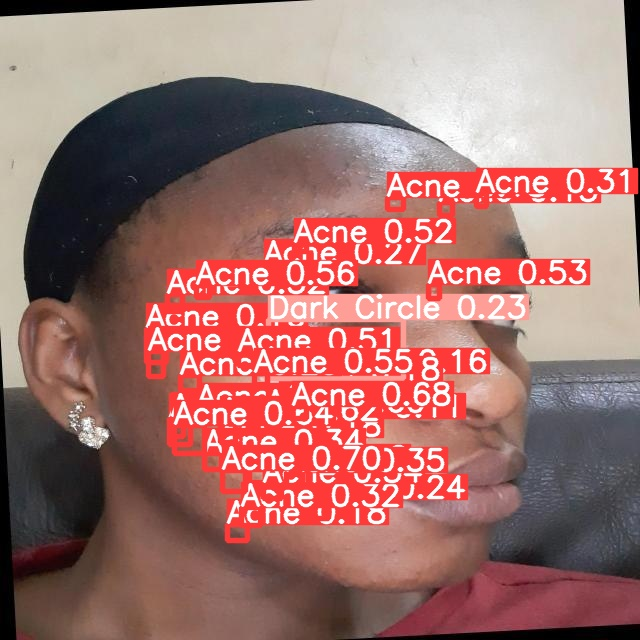

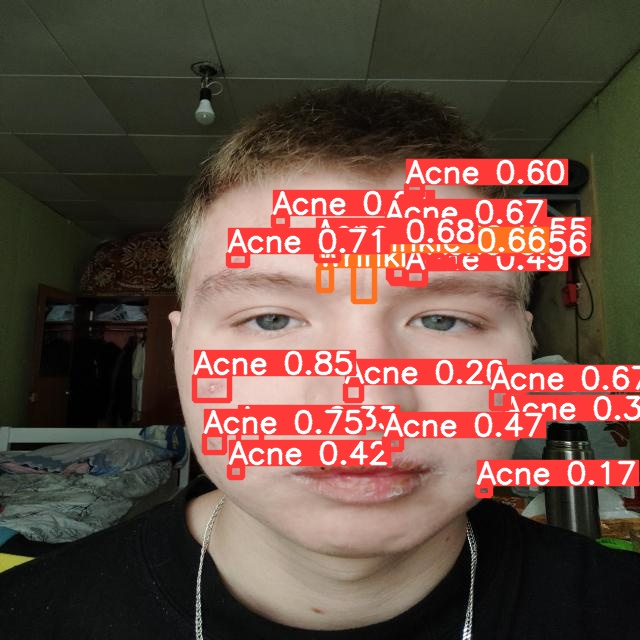

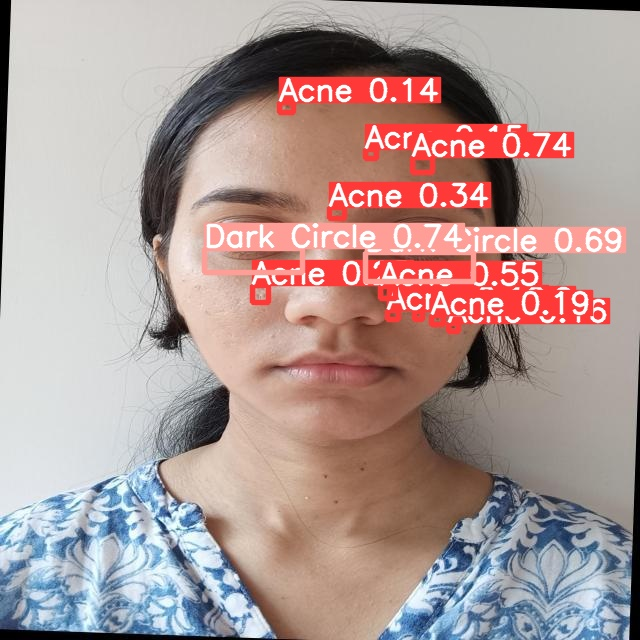

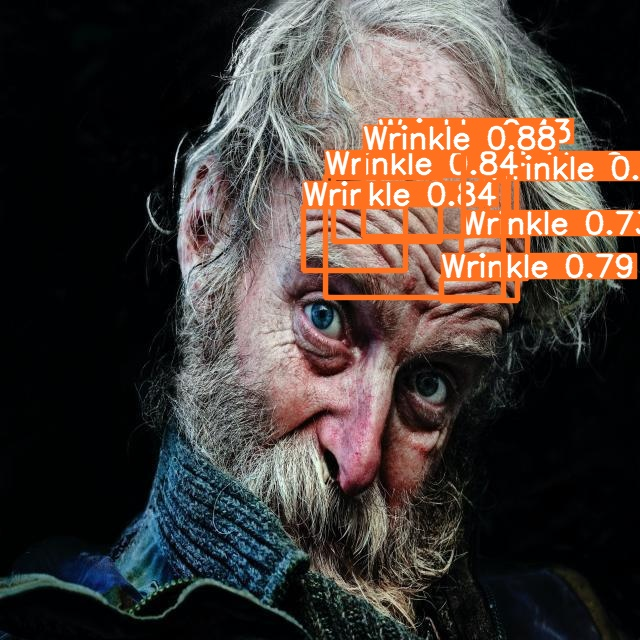

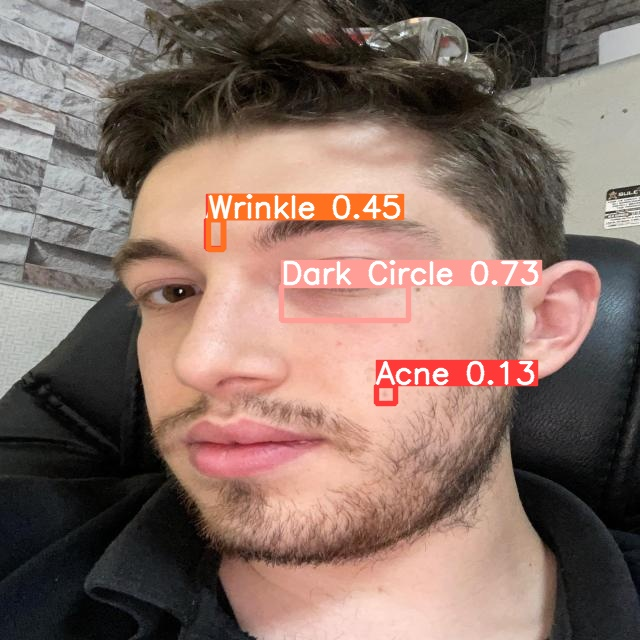

...

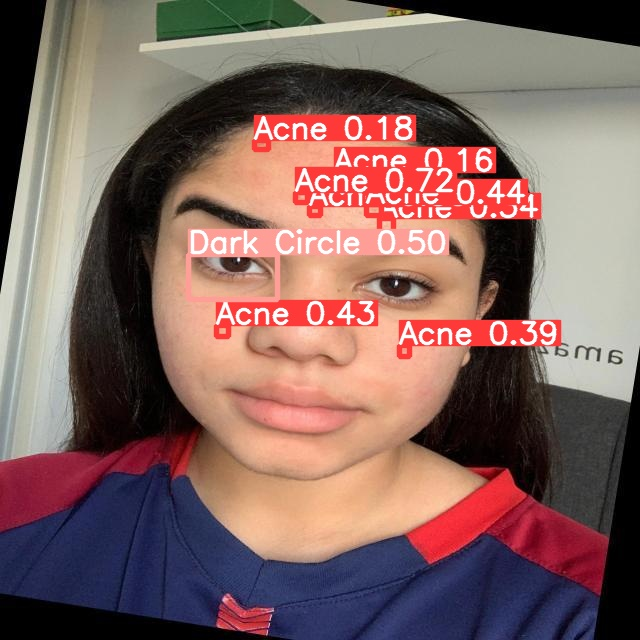

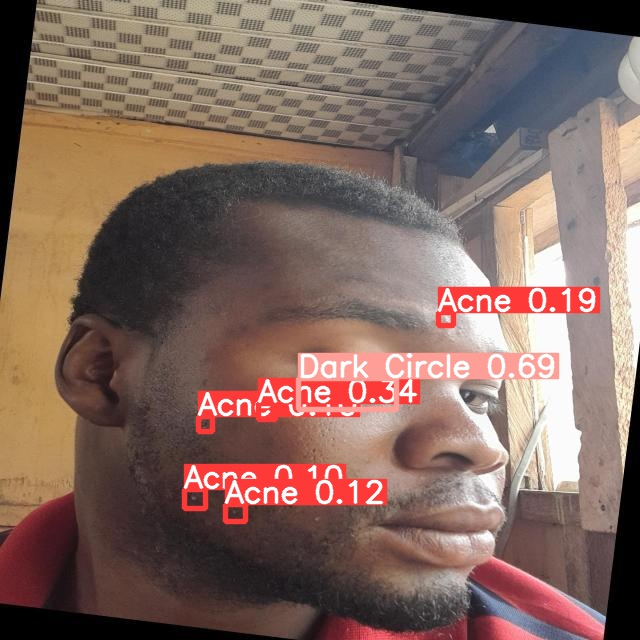

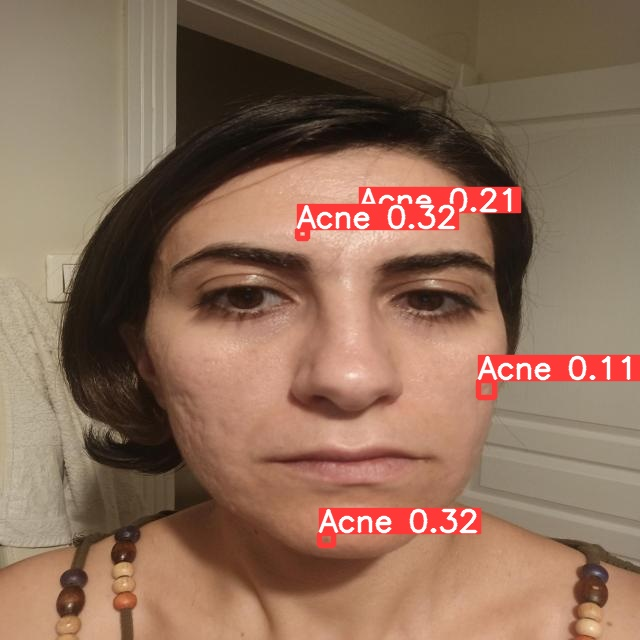

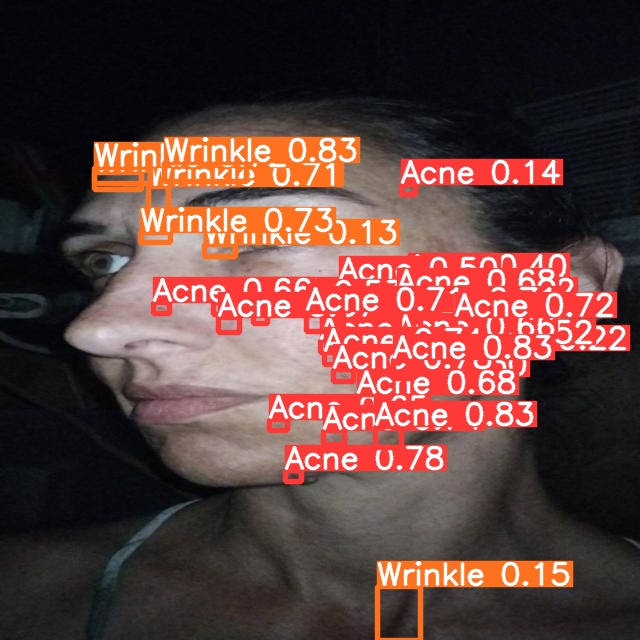

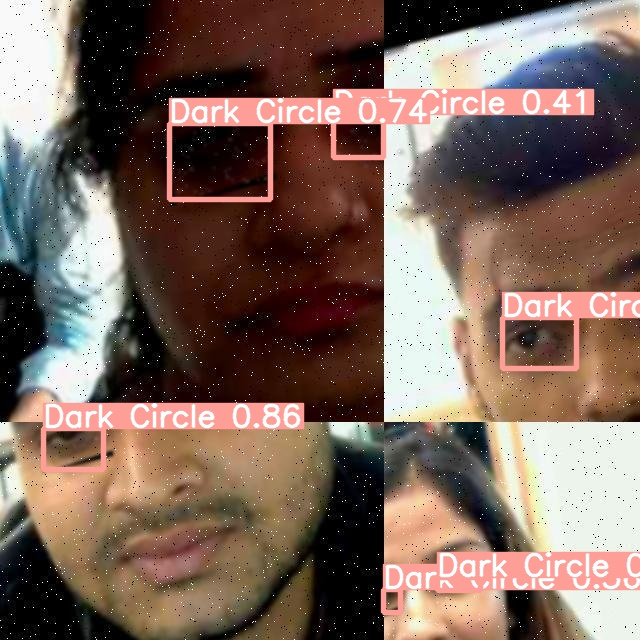

In [8]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Download best.pt

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('/content/yolov5/runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download confussion_matrix.png

In [ ]:
files.download('/content/yolov5/runs/train/exp3/confusion_matrix.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

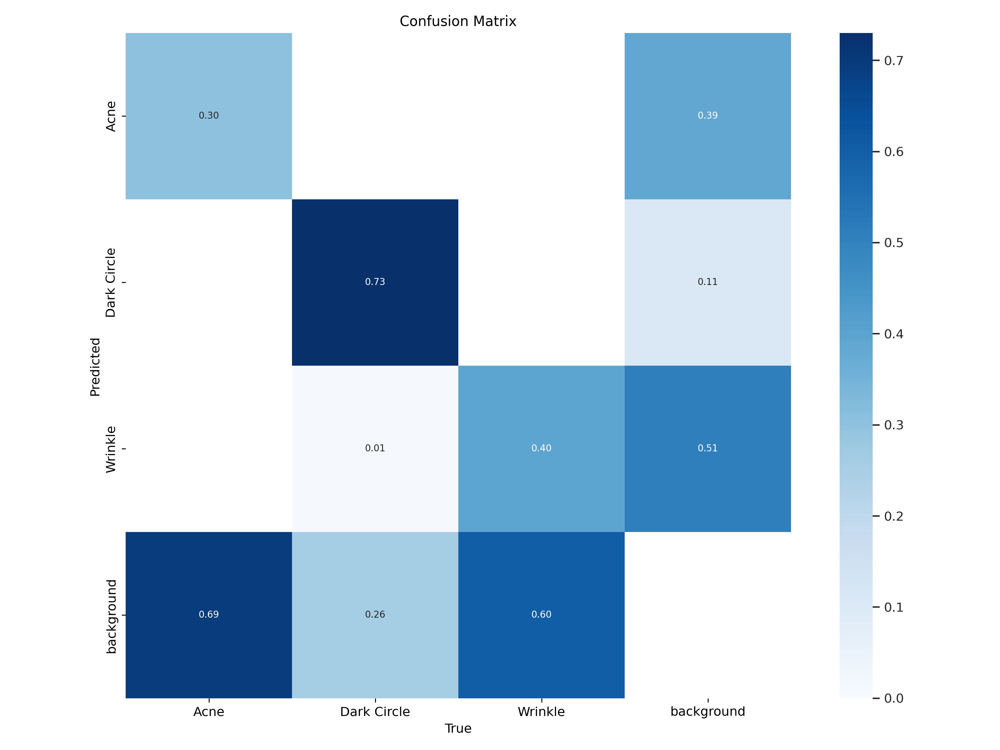

In [9]:
from IPython.display import display, Image

Image(filename=f'/content/yolov5/runs/train/exp/confusion_matrix.png', width=600)

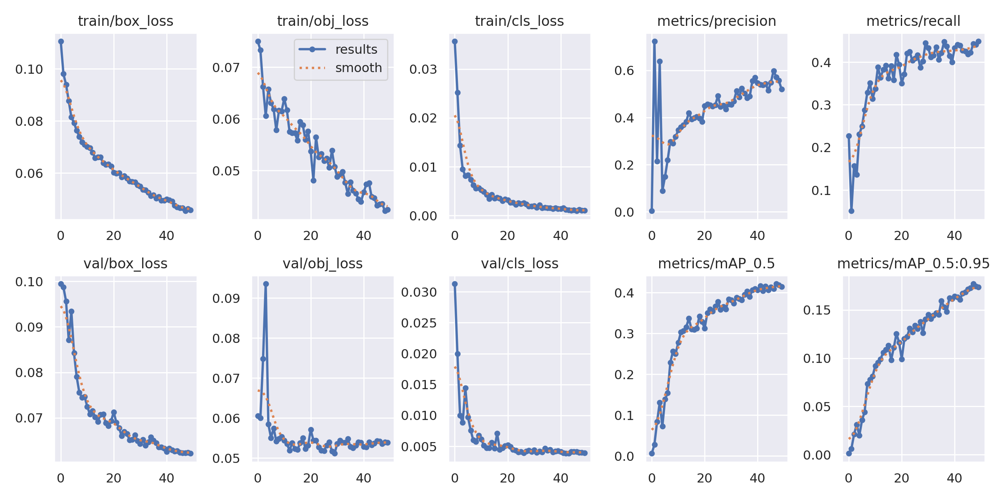

In [10]:
Image(filename=f'/content/yolov5/runs/train/exp/results.png', width=600)

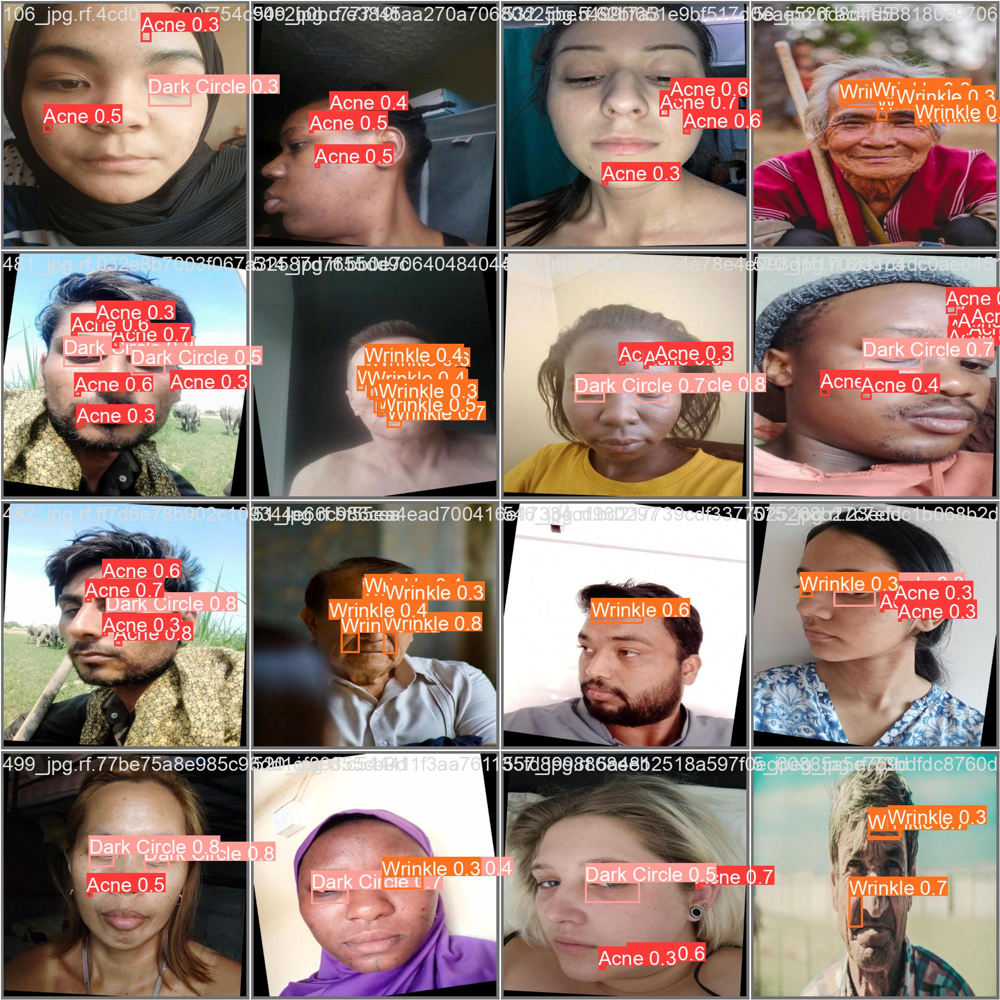

In [11]:
Image(filename=f'/content/yolov5/runs/train/exp/val_batch0_pred.jpg', width=600)

# Convert

Import modul yang dibutuhkan

In [ ]:
from ultralytics import YOLO
import torch
import json
import tensorflow.keras as keras
import shutil
from google.colab import files
model_path = '/content/yolov5/runs/train/exp3/weights/best.pt'
model = YOLO(model_path)

## Convert to JSON

In [ ]:
model = YOLO(model_path)

state_dict = model.model.state_dict()
state_dict_json = {key: value.tolist() for key, value in state_dict.items()}

json_path = 'model_parameters.json'
with open(json_path, 'w') as json_file:
    json.dump(state_dict_json, json_file)

print(f"Model parameters have been saved to {json_path}")


Model parameters have been saved to model_parameters.json


In [ ]:
files.download('/content/yolov5/model_parameters.json')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Convert to TFLite and ONXX

In [ ]:
model.export(format="tflite")

Ultralytics YOLOv8.2.31 🚀 Python-3.10.12 torch-2.3.0+cu121 CPU (Intel Xeon 2.00GHz)


Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs



PyTorch: starting from '/content/yolov5/runs/train/exp3/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 25200, 8), ()) (14.1 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0', 'onnx2tf>1.17.5,<=1.22.3', 'sng4onnx>=1.0.1', 'onnxslim==0.1.28', 'onnx_graphsurgeon>=0.3.26', 'tflite_support', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 125.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.0/435.0 kB 304.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.3/118.3 kB 45.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 179.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 MB 202.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 MB 272.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

100%|██████████| 1.11M/1.11M [00:00<00:00, 48.7MB/s]
Unzipping calibration_image_sample_data_20x128x128x3_float32.npy.zip to /content/yolov5/calibration_image_sample_data_20x128x128x3_float32.npy...: 100%|██████████| 1/1 [00:00<00:00, 46.84file/s]


ONNX: starting export with onnx 1.16.1 opset 17...


ONNX: slimming with onnxslim 0.1.28...
ONNX: export success ✅ 1.4s, saved as '/content/yolov5/runs/train/exp3/weights/best.onnx' (27.2 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...
TensorFlow SavedModel: export success ✅ 56.7s, saved as '/content/yolov5/runs/train/exp3/weights/best_saved_model' (68.2 MB)

TensorFlow Lite: starting export with tensorflow 2.15.0...
TensorFlow Lite: export success ✅ 0.0s, saved as '/content/yolov5/runs/train/exp3/weights/best_saved_model/best_float32.tflite' (27.2 MB)

Export complete (58.6s)
Results saved to /content/yolov5/runs/train/exp3/weights
Predict:         yolo predict task=detect model=/content/yolov5/runs/train/exp3/weights/best_saved_model/best_float32.tflite imgsz=640  
Validate:        yolo val task=detect model=/content/yolov5/runs/train/exp3/weights/best_saved_model/best_float32.tflite imgsz=640 data=None  
Visualize:       https://netron.app


'/content/yolov5/runs/train/exp3/weights/best_saved_model/best_float32.tflite'

In [ ]:
files.download('/content/yolov5/runs/train/exp3/weights/best_saved_model/best_float32.tflite')
files.download('/content/yolov5/runs/train/exp3/weights/best_saved_model/best_float16.tflite')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download('/content/yolov5/runs/train/exp/weights/best.onnx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Convert TFJS

In [ ]:
model.export(format="tfjs")

In [ ]:
!yolo export model=best.pt format=tfjs